# **P**anatopic **A**dversarial **N**uclei **C**lassification **a**nd **K**nowledge-**E**nhanced **S**egmentation using Pathopix-GANs

Dataset Structure
The dataset is organized into three folds: fold1, fold2, and fold3, consistent with the original dataset structure. Each fold contains data in a tabular format with the following four columns:

image: The RGB tile of the sample.
instances: A list of nuclei instances. Each instance represents exactly one nucleus and is in binary format (1 - nucleus, 0 - background)
categories: An integer class label for each nucleus, corresponding to one of the following categories:

1. Neoplastic
2. Inflammatory
3. Connective
4. Dead
5. Epithelial

tissue: The integer tissue type from which the sample originates, belonging to one of these categories:

1. Adrenal Gland
2. Bile Duct
3. Bladder
4. Breast
5. Cervix
6. Colon
7. Esophagus
8. Head & Neck
9. Kidney
10. Liver
11. Lung
12. Ovarian
13. Pancreatic
14. Prostate
15. Skin
16. Stomach
17. Testis
18. Thyroid
19. Uterus




### **Libraries**

In [1]:
import pandas as pd
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
import warnings
import ast
from collections import Counter
import seaborn as sns
import shutil
import glob
from tqdm import tqdm
from PIL import Image
import pickle
import random
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

from datasets import Dataset

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import torch.nn.functional as F

warnings.filterwarnings('ignore')

### **Setting Diffusers**

In [2]:
%%capture
!pip install -U diffusers[training]

In [ ]:
import os
os.environ["HF_TOKEN"] = ""

from huggingface_hub import login
login(token=os.environ["HF_TOKEN"])

Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


In [4]:
%%capture
!sudo apt -qq install git-lfs
!git config --global credential.helper store

### **Data Class**

In [2]:
from dataclasses import dataclass

@dataclass
class TrainingConfig:
    image_size = 256
    train_batch_size = 4
    eval_batch_size = 4 
    num_epochs = 250
    gradient_accumulation_steps = 1
    learning_rate = 1e-4
    lr_warmup_steps = 500
    save_image_epochs = 10
    save_model_epochs = 30
    mixed_precision = 'fp16'
    output_dir = 'pannuke-finetuned-ddpm-256'

    push_to_hub = True
    hub_private_repo = False  
    overwrite_output_dir = True
    seed = 0

config = TrainingConfig()

### **Loading Dataset & Conversion**

In [6]:
from datasets import load_dataset, Dataset
import numpy as np
from huggingface_hub import hf_hub_download

repo_id = "ahmedembedded/PanNuke"
config.dataset_name = repo_id
file_name = "dead_cells.npz"

file_path = hf_hub_download(repo_id=repo_id, filename=file_name, repo_type="dataset")

npz_data = np.load(file_path)

images = npz_data["images"]  
masks = npz_data["masks"]    

data = [{"image": img, "mask": mask} for img, mask in zip(images, masks)]

dataset = Dataset.from_list(data)

print(dataset)

dead_cells.npz:   0%|          | 0.00/41.4M [00:00<?, ?B/s]

Dataset({
    features: ['image', 'mask'],
    num_rows: 232
})


In [7]:
dataset = {key: [example for example in tqdm(dataset[key], desc=f"Processing {key}")] for key in dataset.column_names}

Processing mask: 100%|██████████| 232/232 [00:00<00:00, 986895.06it/s]


In [8]:
dataset.keys()

dict_keys(['image', 'mask'])

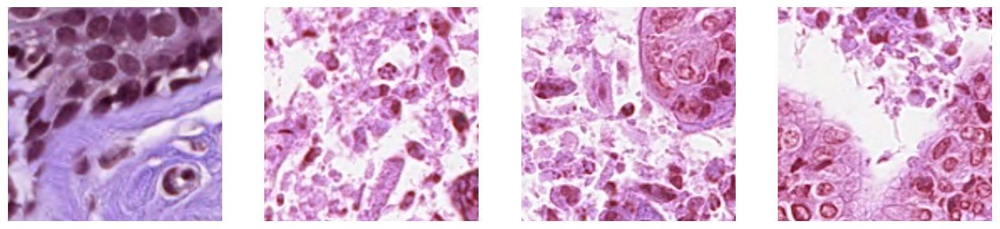

In [9]:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for i, image in enumerate(dataset["image"][:4]):
    axs[i].imshow(image)
    axs[i].set_axis_off()
fig.show()

In [10]:
from torchvision import transforms
from PIL import Image
import torch

preprocess = transforms.Compose([
    transforms.Resize((config.image_size, config.image_size)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

In [11]:
import torch
import numpy as np
from PIL import Image

def transform(examples):
    images = torch.tensor(np.array([
        preprocess(Image.fromarray(np.array(image, dtype=np.uint8)).convert("RGB")).numpy()  
        for image in examples["image"]
    ])).float()

    examples["image"] = torch.tensor(np.array([
        np.array(image, dtype=np.uint8)  
        for image in examples["image"]
    ])).float()

    examples["mask"] = torch.tensor(np.array([
        np.array(mask, dtype=np.uint8)  
        for mask in examples["mask"]
    ])).float()

    examples["images"] = images

    return examples

dataset = transform(dataset)

In [12]:
class CustomDataset(Dataset):
    def __init__(self, dataset):
        self.images = dataset['image']
        self.masks = dataset['mask']
        self.image_names = dataset['images']
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        sample = {
            'image': self.images[idx],
            'mask': self.masks[idx],
            'images': self.image_names[idx]
        }
        return sample

dataset_obj = CustomDataset(dataset)
train_dataloader = DataLoader(dataset_obj, batch_size=config.train_batch_size, shuffle=True)

for batch in train_dataloader:
    images = batch['image']
    masks = batch['mask']
    images_tr = batch['images']
    print(f"Batch images: {images.shape}\nBatch masks: {masks.shape}\nBatch image transformed: {images_tr.shape}")
    break

Batch images: torch.Size([4, 256, 256, 3])
Batch masks: torch.Size([4, 256, 256])
Batch image transformed: torch.Size([4, 3, 256, 256])


### **Model Declaration**

In [13]:
from diffusers import UNet2DModel


model = UNet2DModel(
    sample_size=config.image_size,  # the target image resolution
    in_channels=3,  # the number of input channels, 3 for RGB images
    out_channels=3,  # the number of output channels
    layers_per_block=2,  # how many ResNet layers to use per UNet block
    block_out_channels=(128, 128, 256, 256, 512, 512),  # the number of output channes for each UNet block
    down_block_types=( 
        "DownBlock2D",  # a regular ResNet downsampling block
        "DownBlock2D", 
        "DownBlock2D", 
        "DownBlock2D", 
        "AttnDownBlock2D",  # a ResNet downsampling block with spatial self-attention
        "DownBlock2D",
    ), 
    up_block_types=(
        "UpBlock2D",  # a regular ResNet upsampling block
        "AttnUpBlock2D",  # a ResNet upsampling block with spatial self-attention
        "UpBlock2D", 
        "UpBlock2D", 
        "UpBlock2D", 
        "UpBlock2D"  
      ),
)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [14]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
#model = torch.nn.DataParallel(model, device_ids = [0,1]).to(device)
#print()

In [15]:
sample_image = dataset['images'][0].unsqueeze(0)
print('Input shape:', sample_image.shape)

Input shape: torch.Size([1, 3, 256, 256])


In [16]:
print('Output shape:', model(sample_image, timestep=0).sample.shape)

Output shape: torch.Size([1, 3, 256, 256])


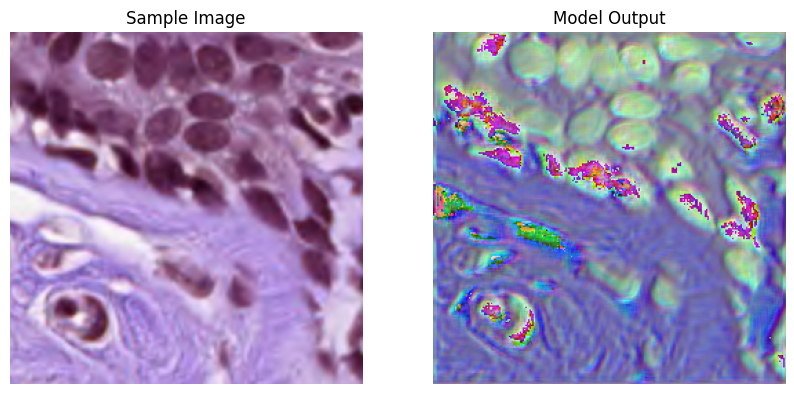

In [17]:
import torch
import matplotlib.pyplot as plt
from PIL import Image

def tensor_to_image(tensor):
    tensor = tensor.to("cpu")
    return Image.fromarray(((tensor.permute(0, 2, 3, 1) + 1.0) * 127.5)
                           .type(torch.uint8)
                           .numpy()[0])

#sample_image = sample_image.to("cuda")
output_image = model(sample_image, timestep=0).sample

sample_image_pil = tensor_to_image(sample_image)
output_image_pil = tensor_to_image(output_image)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(sample_image_pil)
axes[0].set_title("Sample Image")
axes[0].axis("off")

axes[1].imshow(output_image_pil)
axes[1].set_title("Model Output")
axes[1].axis("off")

plt.show()

In [18]:
from diffusers import DDPMScheduler

noise_scheduler = DDPMScheduler(num_train_timesteps=1000)

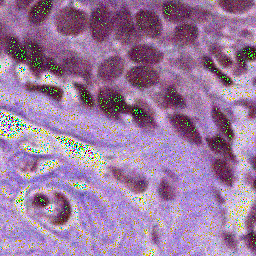

In [19]:
import torch
from PIL import Image

noise = torch.randn(sample_image.shape)
timesteps = torch.LongTensor([50])
noisy_image = noise_scheduler.add_noise(sample_image, noise, timesteps)

Image.fromarray(((noisy_image.permute(0, 2, 3, 1) + 1.0) * 127.5).type(torch.uint8).numpy()[0])

In [20]:
import torch.nn.functional as F

noise_pred = model(noisy_image, timesteps).sample
loss = F.mse_loss(noise_pred, noise)

In [21]:
optimizer = torch.optim.AdamW(model.parameters(), lr=config.learning_rate)

In [22]:
from diffusers.optimization import get_cosine_schedule_with_warmup

lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer=optimizer,
    num_warmup_steps=config.lr_warmup_steps,
    num_training_steps=(len(train_dataloader) * config.num_epochs),
)

In [23]:
from diffusers import DDPMPipeline

import math

def make_grid(images, rows, cols):
    w, h = images[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, image in enumerate(images):
        grid.paste(image, box=(i%cols*w, i//cols*h))
    return grid

def evaluate(config, epoch, pipeline):
    images = pipeline(
        batch_size = config.eval_batch_size, 
        generator=torch.manual_seed(config.seed),
    ).images

    image_grid = make_grid(images, rows=4, cols=4)

    test_dir = os.path.join(config.output_dir, "samples")
    os.makedirs(test_dir, exist_ok=True)
    image_grid.save(f"{test_dir}/{epoch:04d}.png")

In [24]:
from accelerate import Accelerator
from accelerate.utils import ProjectConfiguration
from huggingface_hub import create_repo, upload_folder

from tqdm.auto import tqdm
from pathlib import Path
import os

def train_loop(config, model, noise_scheduler, optimizer, train_dataloader, lr_scheduler):
    # Initialize accelerator and tensorboard logging
    logging_dir = os.path.join(config.output_dir, "logs")
    accelerator_project_config = ProjectConfiguration(project_dir=config.output_dir, logging_dir=logging_dir)
    accelerator = Accelerator(
        mixed_precision=config.mixed_precision,
        gradient_accumulation_steps=config.gradient_accumulation_steps, 
        log_with="tensorboard",
        project_config=accelerator_project_config,
    )
    if accelerator.is_main_process:
        if config.push_to_hub:
            repo_id = create_repo(
                repo_id=Path(config.output_dir).name, exist_ok=True
            ).repo_id
        elif config.output_dir is not None:
            os.makedirs(config.output_dir, exist_ok=True)
        accelerator.init_trackers("train_example")
    
    # Prepare everything
    # There is no specific order to remember, you just need to unpack the 
    # objects in the same order you gave them to the prepare method.
    model, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
        model, optimizer, train_dataloader, lr_scheduler
    )
    
    global_step = 0

    # Now you train the model
    for epoch in range(config.num_epochs):
        progress_bar = tqdm(total=len(train_dataloader), disable=not accelerator.is_local_main_process)
        progress_bar.set_description(f"Epoch {epoch}")

        
        
        for step, batch in enumerate(train_dataloader):
            clean_images = batch['images']
            # Sample noise to add to the images
            noise = torch.randn(clean_images.shape).to(clean_images.device)
            bs = clean_images.shape[0]

            # Sample a random timestep for each image
            timesteps = torch.randint(0, noise_scheduler.num_train_timesteps, (bs,), device=clean_images.device).long()

            # Add noise to the clean images according to the noise magnitude at each timestep
            # (this is the forward diffusion process)
            noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)
            
            with accelerator.accumulate(model):
                # Predict the noise residual
                noise_pred = model(noisy_images, timesteps, return_dict=False)[0]
                loss = F.mse_loss(noise_pred, noise)
                accelerator.backward(loss)

                accelerator.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                lr_scheduler.step()
                optimizer.zero_grad()
            
            progress_bar.update(1)
            logs = {"loss": loss.detach().item(), "lr": lr_scheduler.get_last_lr()[0], "step": global_step}
            progress_bar.set_postfix(**logs)
            accelerator.log(logs, step=global_step)
            global_step += 1

        if accelerator.is_main_process:
            pipeline = DDPMPipeline(unet=accelerator.unwrap_model(model), scheduler=noise_scheduler)

            if (epoch + 1) % config.save_image_epochs == 0 or epoch == config.num_epochs - 1:
                evaluate(config, epoch, pipeline)
                
                global sample_image
                sample_image = sample_image.to(device)
                sample_image_pil = tensor_to_image(sample_image)
                output_image = model(sample_image, timestep=0).sample
                output_image_pil = tensor_to_image(output_image)
                
                fig, axes = plt.subplots(1, 2, figsize=(10, 5))
                
                axes[0].imshow(sample_image_pil)
                axes[0].set_title("Sample Image")
                axes[0].axis("off")
                
                axes[1].imshow(output_image_pil)
                axes[1].set_title("Model Output")
                axes[1].axis("off")
                
                plt.show()

            if (epoch + 1) % config.save_model_epochs == 0 or epoch == config.num_epochs - 1:
                if config.push_to_hub:
                    upload_folder(
                        repo_id=repo_id,
                        folder_path=config.output_dir,
                        commit_message=f"Epoch {epoch}",
                        ignore_patterns=["step_*", "epoch_*"],
                    )
                else:
                    pipeline.save_pretrained(config.output_dir) 

### **Training Code**

In [ ]:
from accelerate import notebook_launcher
args = (config, model, noise_scheduler, optimizer, train_dataloader, lr_scheduler)

notebook_launcher(train_loop, args, num_processes=1)

### **Per 50 Epochs Results**

After Epoch: 0009


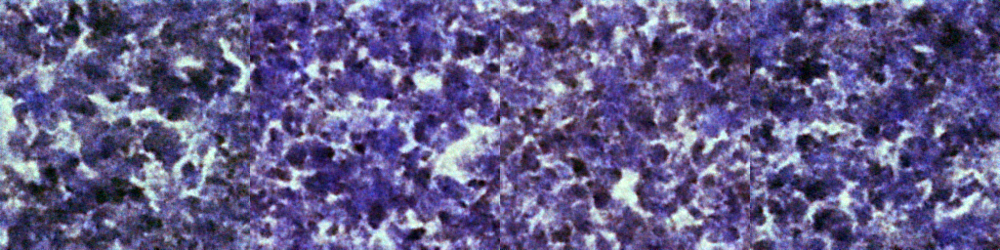

After Epoch: 0049


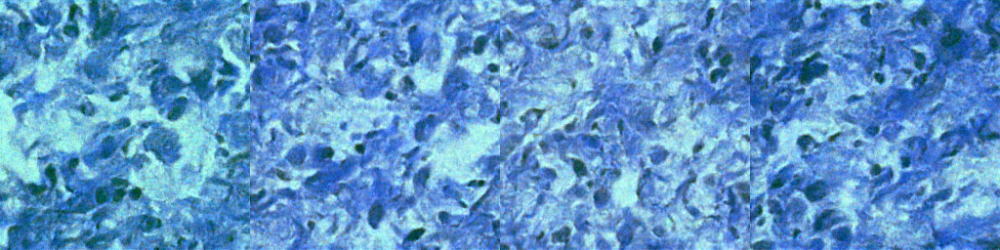

After Epoch: 0099


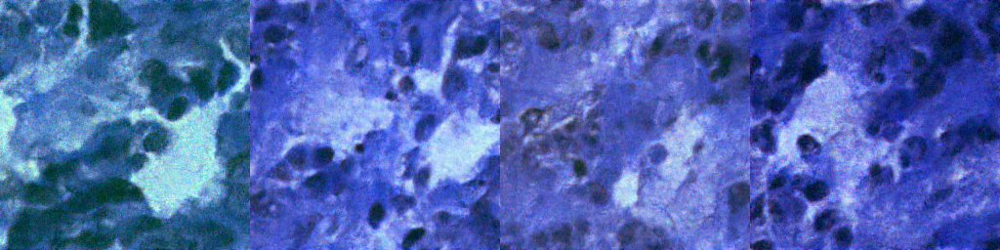

After Epoch: 0149


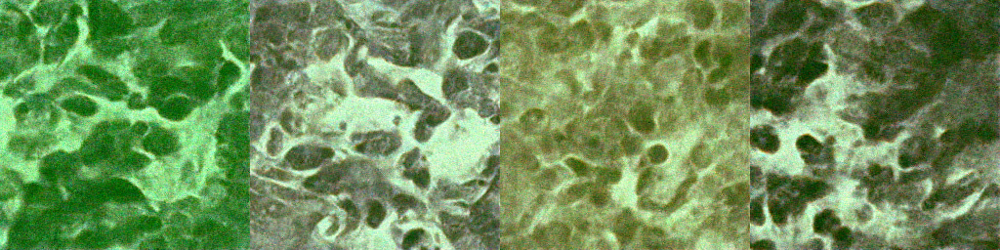

After Epoch: 0199


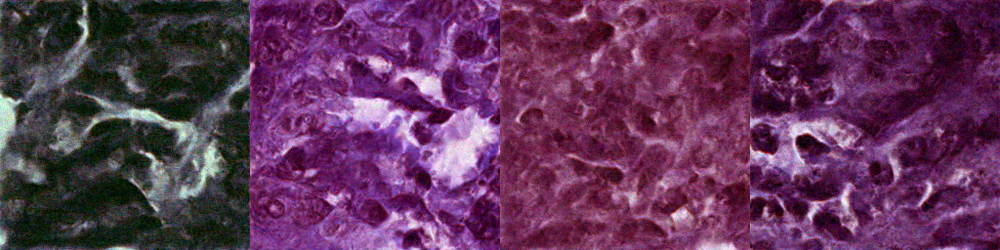

After Epoch: 0249


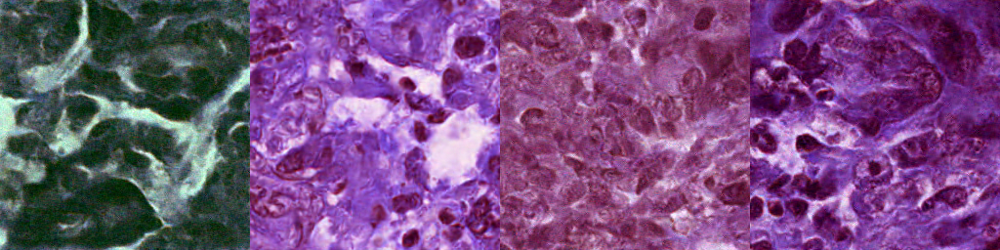

In [5]:
import glob
import os
from IPython.display import display
from PIL import Image

sample_images = sorted(glob.glob(f"{config.output_dir}/samples/*.png"))

for image_path in sample_images:
    filename = os.path.basename(image_path)
    print(f"After Epoch: {filename[:4]}")
    
    img = Image.open(image_path)
    width, height = img.size
    top_quarter = img.crop((0, 0, width, height // 4))

    display(img)

### **Saving Model and Configs**

In [ ]:
import torch

checkpoint = {
    "model_state": model.state_dict(),
    "config": config,
    "noise_scheduler": noise_scheduler.state_dict(),
    "optimizer_state": optimizer.state_dict(),
    "lr_scheduler_state": lr_scheduler.state_dict()
}

torch.save(checkpoint, "model_checkpoint.pth")